# **Project: CycleGAN**

Reference [CycleGan Github](https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix/blob/master/CycleGAN.ipynb) for tuning parameters and understanding how model works

In [ ]:
# Imports
!pip install dominate

import torch

import os
from PIL import Image
from IPython.display import display
import glob
import random
import shutil
import dominate

import cv2
import matplotlib.pyplot as plt
import numpy as np

import re
import pandas as pd

In [ ]:
# GPU SetUp
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device in use: ", device)

Device in use:  cuda


In [ ]:
# !pip install --quiet torch torchvision tqpm Pillow=9.5.0

# # Clone Official CycleGAN/pix2pix repo
# !git clone --depth 1 https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix.git
# %cd pytorch-CycleGAN-and-pix2pix

# # Install required packages
# !pip install -q -r requirements.txt || true

# Mounting Dataset (maybe from google drive)

In [ ]:
# Edit this to wherever the data lives on your computer

from google.colab import drive
drive.mount('/content/drive')


# --------------------------------------------
# SHARED INPUT ROOT (READ-ONLY)
# --------------------------------------------
# This is the folder your group already uses.
# We will ONLY READ data from here (CT, Cryo, models, etc.).
basePath = "/content/drive/My Drive/Colab Notebooks/Computer Vision/Project files/CV Project- Formatted Data/"

# These are your existing CT and Cryo folders inside the shared project.
# IMPORTANT: We do NOT write anything into these; we just read.
ct_dir   = os.path.join(basePath, "CT")    # shared CT PNGs
cryo_dir = os.path.join(basePath, "Cryo")  # shared Cryo PNGs

print("Shared input CT dir   :", ct_dir)
print("Shared input Cryo dir :", cryo_dir)
print("  CT exists?  ", os.path.isdir(ct_dir))
print("  Cryo exists?", os.path.isdir(cryo_dir))

# --------------------------------------------
# PRIVATE OUTPUT ROOT (ELLIE'S WORKSPACE)
# --------------------------------------------
# All NEW things (paired data, pix2pix images, etc.)
# will be written ONLY into this folder.
ellie_base = "/content/drive/My Drive/Colab Notebooks/Computer Vision/CV Project- Ellie/"

# Create Ellie's base folder if it does not exist yet.
os.makedirs(ellie_base, exist_ok=True)

print("\nEllie's output base:", ellie_base)
print("  Exists? ", os.path.isdir(ellie_base))

# Root folder for ALL pix2pix data
# Everything we generate for pix2pix will live only here.
pix2pix_root = os.path.join(ellie_base, "pix2pix_dataset")

# Subfolders for train / val / test splits
train_dir = os.path.join(pix2pix_root, "train")
val_dir   = os.path.join(pix2pix_root, "val")
test_dir  = os.path.join(pix2pix_root, "test")

# Create the folders if they do not exist yet
os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir,   exist_ok=True)
os.makedirs(test_dir,  exist_ok=True)

print("Pix2Pix dataset will be stored under:")
print("  Root :", pix2pix_root)
print("  Train:", train_dir)
print("  Val  :", val_dir)
print("  Test :", test_dir)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Shared input CT dir   : /content/drive/My Drive/Colab Notebooks/Computer Vision/Project files/CV Project- Formatted Data/CT
Shared input Cryo dir : /content/drive/My Drive/Colab Notebooks/Computer Vision/Project files/CV Project- Formatted Data/Cryo
  CT exists?   True
  Cryo exists? True

Ellie's output base: /content/drive/My Drive/Colab Notebooks/Computer Vision/CV Project- Ellie/
  Exists?  True
Pix2Pix dataset will be stored under:
  Root : /content/drive/My Drive/Colab Notebooks/Computer Vision/CV Project- Ellie/pix2pix_dataset
  Train: /content/drive/My Drive/Colab Notebooks/Computer Vision/CV Project- Ellie/pix2pix_dataset/train
  Val  : /content/drive/My Drive/Colab Notebooks/Computer Vision/CV Project- Ellie/pix2pix_dataset/val
  Test : /content/drive/My Drive/Colab Notebooks/Computer Vision/CV Project- Ellie/pix2pix_dataset/test


In [ ]:
# Paths to the CT and Cryo folders.
# These MUST match the names you see in Google Drive exactly.
ct_dir   = os.path.join(basePath, "CT")    # Folder that contains CT PNGs
cryo_dir = os.path.join(basePath, "Cryo")  # Folder that contains Cryo PNGs

# Check that the directories exist. If you see 'False', fix basePath or folder names.
print("CT directory exists?:  ", os.path.isdir(ct_dir))
print("Cryo directory exists?:", os.path.isdir(cryo_dir))

def numeric_sort_key(name: str) -> int:
    """
    Extract the first integer that appears in 'name'.
    This lets us sort files like '0000.png', '0010.png', '0200.png'
    in the correct numeric order.
    """
    match = re.search(r"(\d+)", name)  # find one or more digits
    if match:
        return int(match.group(1))     # convert matched digits to integer
    else:
        return -1                      # if no digits found, treat as -1

def get_sorted_pngs(folder: str):
    """
    Return a list of all .png files in 'folder', sorted by numeric order.
    Example:
        ['0000.png', '0001.png', '0002.png', ...]
    """
    # Keep only files that end with ".png" (case-insensitive)
    files = [f for f in os.listdir(folder) if f.lower().endswith(".png")]
    # Sort using numeric index extracted from filename
    files = sorted(files, key=numeric_sort_key)
    return files

# Get the sorted lists for CT and Cryo.
ct_files   = get_sorted_pngs(ct_dir)
cryo_files = get_sorted_pngs(cryo_dir)

# Store counts for convenience.
N_ct   = len(ct_files)
N_cryo = len(cryo_files)

# Print basic info so you can sanity-check.
print("Number of CT slices  :", N_ct)
print("Number of Cryo slices:", N_cryo)
print("First CT filename    :", ct_files[0] if N_ct   > 0 else "NONE")
print("First Cryo filename  :", cryo_files[0] if N_cryo > 0 else "NONE")


CT directory exists?:   True
Cryo directory exists?: True
Number of CT slices  : 463
Number of Cryo slices: 1477
First CT filename    : 0000.png
First Cryo filename  : 0000.png


# Keystone Pairs

## Browse Images to find Keystone Pairs

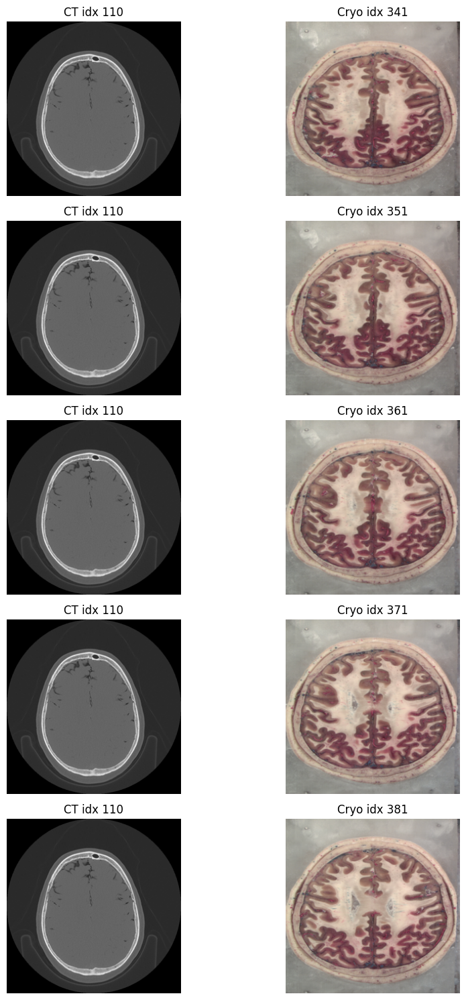

In [ ]:
def show_ct_with_cryo_rows(ct_idx: int, cryo_indices):
    """
    Display several rows, each row showing:
        [ CT image | ONE Cryo candidate ]

    Parameters:
        ct_idx       : index of CT slice in 'ct_files' list
        cryo_indices : list of indices into 'cryo_files' list

    This is meant for MANUAL INSPECTION.
    You change 'ct_idx' and 'cryo_indices' to browse the data.
    """
    # ------------- SAFETY CHECKS -------------
    if not (0 <= ct_idx < N_ct):
        raise ValueError(f"ct_idx {ct_idx} is out of range [0, {N_ct-1}]")
    for k in cryo_indices:
        if not (0 <= k < N_cryo):
            raise ValueError(f"cryo index {k} is out of range [0, {N_cryo-1}]")

    # ------------- LOAD CT IMAGE -------------
    ct_path = os.path.join(ct_dir, ct_files[ct_idx])
    ct_img = Image.open(ct_path)

    # ------------- PREPARE PLOTTING -------------
    num_rows = len(cryo_indices)
    # Make a figure with 'num_rows' rows and 2 columns (CT | Cryo)
    fig, axes = plt.subplots(
        nrows=num_rows,
        ncols=2,
        figsize=(10, 3 * num_rows)
    )

    # If there is only one row, 'axes' is a 1D array; make it a list for consistency
    if num_rows == 1:
        axes = [axes]

    # ------------- DRAW EACH ROW -------------
    for row, k in enumerate(cryo_indices):
        cryo_path = os.path.join(cryo_dir, cryo_files[k])
        cryo_img = Image.open(cryo_path)

        # Left: CT
        ax_ct   = axes[row][0]
        ax_ct.imshow(ct_img, cmap="gray")
        ax_ct.set_title(f"CT idx {ct_idx}")
        ax_ct.axis("off")

        # Right: Cryo
        ax_cryo = axes[row][1]
        ax_cryo.imshow(cryo_img)
        ax_cryo.set_title(f"Cryo idx {k}")
        ax_cryo.axis("off")

    plt.tight_layout()
    plt.show()

# ------------------------------------------------
# EXAMPLE USAGE:
#   You can EDIT these numbers freely to browse.
# ------------------------------------------------

# Example: look at CT index 110 against several Cryo choices
example_ct_index    = 110                         # <- change this CT index as you like
example_cryo_indices = [341, 351, 361, 371, 381]  # <- change/add/remove Cryo indices

show_ct_with_cryo_rows(example_ct_index, example_cryo_indices)




## Selected Keystone Pairs

Using keystones (CT -> Cryo):
   CT 110  ->  Cryo 361
   CT 188  ->  Cryo 666
   CT 350  ->  Cryo 1207

Total paired slices created: 463 (should equal N_ct)

Sample mappings (CT index -> Cryo index):
  CT   0 -> Cryo    0
  CT 110 -> Cryo  361
  CT 188 -> Cryo  666
  CT 350 -> Cryo 1207
  CT 462 -> Cryo 1476


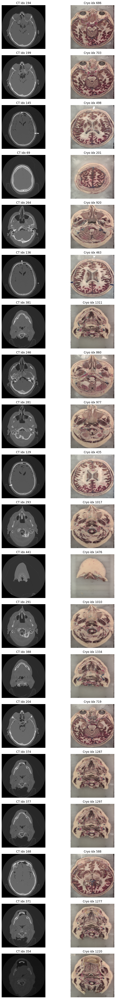

In [ ]:

# Each keystone is a pair:
#   CT index  <->  Cryo index
#
# You can change these numbers if you find better matches using the browser above.
# Just make sure they stay in ascending CT order.
keystone_ct_indices   = [110, 188, 350]   # CT indices (must be increasing)
keystone_cryo_indices = [361, 666, 1207]  # corresponding Cryo indices

# Safety check: same length and sorted
assert len(keystone_ct_indices) == len(keystone_cryo_indices), "Keystone lists must have same length"
assert keystone_ct_indices == sorted(keystone_ct_indices), "CT keystone indices must be sorted ascending"

print("Using keystones (CT -> Cryo):")
for ci, ki in zip(keystone_ct_indices, keystone_cryo_indices):
    print(f"   CT {ci}  ->  Cryo {ki}")

# ------------------------------------------------
# FUNCTION: Map ANY CT index to a Cryo index
# using piecewise linear interpolation between keystones.
# ------------------------------------------------
def map_ct_to_cryo(ct_idx: int) -> int:
    """
    Map a CT slice index (0 .. N_ct-1) to a Cryo slice index,
    using piecewise linear interpolation based on the defined keystones.

    Steps:
      1. If ct_idx is below the first keystone, extrapolate using the first segment.
      2. If ct_idx is above the last keystone, extrapolate using the last segment.
      3. Otherwise, find which segment [CT_i, CT_{i+1}] it falls into and interpolate.
      4. Clamp the final Cryo index into [0, N_cryo-1].
    """
    # Edge case: if only 1 keystone, just return its Cryo index (degenerate case)
    if len(keystone_ct_indices) == 1:
        return keystone_cryo_indices[0]

    # Below the first keystone: extrapolate using first two keystones
    if ct_idx <= keystone_ct_indices[0]:
        x0 = keystone_ct_indices[0]
        x1 = keystone_ct_indices[1]
        y0 = keystone_cryo_indices[0]
        y1 = keystone_cryo_indices[1]
    # Above the last keystone: extrapolate using last two keystones
    elif ct_idx >= keystone_ct_indices[-1]:
        x0 = keystone_ct_indices[-2]
        x1 = keystone_ct_indices[-1]
        y0 = keystone_cryo_indices[-2]
        y1 = keystone_cryo_indices[-1]
    else:
        # Somewhere between two keystones: find the right interval.
        # We look for i such that CT_i <= ct_idx <= CT_{i+1}
        for i in range(len(keystone_ct_indices) - 1):
            if keystone_ct_indices[i] <= ct_idx <= keystone_ct_indices[i + 1]:
                x0 = keystone_ct_indices[i]
                x1 = keystone_ct_indices[i + 1]
                y0 = keystone_cryo_indices[i]
                y1 = keystone_cryo_indices[i + 1]
                break

    # Linear interpolation formula:
    #   ratio = (ct_idx - x0) / (x1 - x0)
    #   cryo_float = y0 + ratio * (y1 - y0)
    if x1 == x0:
        # Prevent division by zero (should never happen if keystones are distinct)
        cryo_float = y0
    else:
        ratio = (ct_idx - x0) / (x1 - x0)
        cryo_float = y0 + ratio * (y1 - y0)

    # Round to nearest integer Cryo index
    cryo_idx = int(round(cryo_float))

    # Clamp into valid Cryo range
    cryo_idx = max(0, min(N_cryo - 1, cryo_idx))

    return cryo_idx

# ------------------------------------------------
# BUILD FULL LIST OF (CT, Cryo) PAIRS USING THE MAPPING ABOVE
# ------------------------------------------------
pairs = []  # list of (ct_path, cryo_path, ct_idx, cryo_idx)

for ct_idx in range(N_ct):
    cryo_idx = map_ct_to_cryo(ct_idx)
    ct_path   = os.path.join(ct_dir,   ct_files[ct_idx])
    cryo_path = os.path.join(cryo_dir, cryo_files[cryo_idx])
    pairs.append((ct_path, cryo_path, ct_idx, cryo_idx))

print(f"\nTotal paired slices created: {len(pairs)} (should equal N_ct)")

# Show some example mappings at the keystones and midpoints
print("\nSample mappings (CT index -> Cryo index):")
for ct_idx in [0, keystone_ct_indices[0], keystone_ct_indices[1],
               keystone_ct_indices[2], N_ct - 1]:
    ct_idx = max(0, min(N_ct - 1, ct_idx))  # ensure in range
    cryo_idx = map_ct_to_cryo(ct_idx)
    print(f"  CT {ct_idx:3d} -> Cryo {cryo_idx:4d}")

# ------------------------------------------------
# RANDOMLY SELECT 20 PAIRS AND PLOT THEM SIDE-BY-SIDE
# ------------------------------------------------
def show_random_pairs(num_pairs: int = 20):
    """
    Randomly pick 'num_pairs' CT–Cryo pairs and display them.
    Each row: [CT | Cryo], with indices in the titles.
    """
    if num_pairs > len(pairs):
        num_pairs = len(pairs)

    # Randomly choose indices in 'pairs' list (without replacement)
    chosen_indices = random.sample(range(len(pairs)), num_pairs)

    # Create a figure with 'num_pairs' rows and 2 columns
    fig, axes = plt.subplots(
        nrows=num_pairs,
        ncols=2,
        figsize=(10, 3 * num_pairs)
    )

    # If only one pair, axes is 1D; normalize to list of rows
    if num_pairs == 1:
        axes = [axes]

    for row, pair_idx in enumerate(chosen_indices):
        ct_path, cryo_path, ct_idx, cryo_idx = pairs[ pair_idx ]

        # Load the images
        ct_img   = Image.open(ct_path)
        cryo_img = Image.open(cryo_path)

        # Left: CT image
        ax_ct   = axes[row][0]
        ax_ct.imshow(ct_img, cmap="gray")
        ax_ct.set_title(f"CT idx {ct_idx}")
        ax_ct.axis("off")

        # Right: Cryo image
        ax_cryo = axes[row][1]
        ax_cryo.imshow(cryo_img)
        ax_cryo.set_title(f"Cryo idx {cryo_idx}")
        ax_cryo.axis("off")

    plt.tight_layout()
    plt.show()

# Actually show 20 random pairs
show_random_pairs(num_pairs=20)


# Build Pix2Pix Dataset from Pairs

## Creating the folders and adding pix2pix

In [ ]:
#Configuration:


# 1) Where to put the pix2pix dataset.
#    This will create a new folder called 'pix2pix_dataset'
#    inside Ellie's private project folder (NOT the shared one).
pix2pix_root = os.path.join(ellie_base, "pix2pix_dataset")


# 2) Desired image size for each HALF of the pix2pix image.
#    Both CT and Cryo will be resized to this (width, height).
#    If your GPU is weak, you can reduce this to (192,192) or (128,128).
target_size = (256, 256)  # (width, height) in pixels

# 3) Train / Val / Test split ratios.
#    These MUST sum to 1.0 (or very close).
train_ratio = 0.8   # 80% of the pairs
val_ratio   = 0.1   # 10% of the pairs
test_ratio  = 0.1   # 10% of the pairs

# ------------------------------------------------
# SAFETY CHECK: Make sure we have 'pairs' from previous cell.
# 'pairs' should be a list of (ct_path, cryo_path, ct_idx, cryo_idx).
# ------------------------------------------------
if "pairs" not in globals():
    raise RuntimeError("The variable 'pairs' is not defined. "
                       "Make sure you ran the previous cell that builds 'pairs' first.")

num_pairs = len(pairs)
print(f"Total pairs available: {num_pairs}")

# ------------------------------------------------
# CREATE OUTPUT FOLDERS:
#   pix2pix_dataset/
#       train/
#       val/
#       test/
# ------------------------------------------------
train_dir = os.path.join(pix2pix_root, "train")
val_dir   = os.path.join(pix2pix_root, "val")
test_dir  = os.path.join(pix2pix_root, "test")

# os.makedirs(path, exist_ok=True) creates the folder if it doesn't exist,
# and does nothing if it already exists.
os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir,   exist_ok=True)
os.makedirs(test_dir,  exist_ok=True)

print("Pix2Pix dataset root:", pix2pix_root)
print("  train dir:", train_dir)
print("  val dir  :", val_dir)
print("  test dir :", test_dir)

# ------------------------------------------------
# FUNCTION: create one pix2pix "AB" image from a (CT, Cryo) pair.
# ------------------------------------------------
def save_ct_cryo_pair_as_pix2pix(
    ct_path: str,
    cryo_path: str,
    save_path: str,
    size = target_size
):
    """
    Load CT and Cryo images, resize them, and place them side-by-side:

        [ CT (left) | Cryo (right) ]

    Then save the result as a single PNG at 'save_path'.

    This is the format expected by the pix2pix 'aligned' dataset.
    """
    # ----- LOAD IMAGES -----
    # .convert('RGB') forces 3 color channels for both CT and Cryo.
    # Pix2Pix default code expects RGB images; CT will just look gray.
    ct_img   = Image.open(ct_path).convert('RGB')
    cryo_img = Image.open(cryo_path).convert('RGB')

    # ----- RESIZE IMAGES -----
    # Both halves must be the same size for side-by-side concatenation.
    # 'size' is (width, height).
    ct_img   = ct_img.resize(size, Image.BICUBIC)
    cryo_img = cryo_img.resize(size, Image.BICUBIC)

    # ----- CONVERT TO NUMPY ARRAYS -----
    ct_arr   = np.array(ct_img)      # shape: (H, W, 3)
    cryo_arr = np.array(cryo_img)    # shape: (H, W, 3)

    # ----- CONCATENATE SIDE-BY-SIDE -----
    # axis=1 means join along the width dimension:
    #   final width = W_ct + W_cryo
    combined = np.concatenate([ct_arr, cryo_arr], axis=1)

    # ----- CONVERT BACK TO IMAGE AND SAVE -----
    combined_img = Image.fromarray(combined)
    combined_img.save(save_path)

# ------------------------------------------------
# SPLIT 'pairs' INTO TRAIN / VAL / TEST
# ------------------------------------------------

# First, create an index list for all pairs: [0, 1, 2, ..., num_pairs-1]
all_indices = list(range(num_pairs))

# Shuffle to make the split random
random.shuffle(all_indices)

# Compute how many go into each split.
num_train = int(round(train_ratio * num_pairs))
num_val   = int(round(val_ratio   * num_pairs))
# Whatever is left goes to test (to avoid rounding issues).
num_test  = num_pairs - num_train - num_val

print(f"\nSplitting into:")
print(f"  Train: {num_train} pairs")
print(f"  Val  : {num_val} pairs")
print(f"  Test : {num_test} pairs")

# Slices of the shuffled indices for each split.
train_indices = all_indices[:num_train]
val_indices   = all_indices[num_train:num_train + num_val]
test_indices  = all_indices[num_train + num_val:]

# Quick sanity check: they should cover all indices exactly once.
assert len(set(train_indices + val_indices + test_indices)) == num_pairs

# ------------------------------------------------
# HELPER: zero-pad indices for filenames (e.g., 0000.png, 0001.png, ...)
# ------------------------------------------------
# Determine how many digits we need based on num_pairs.
# Example: 463 pairs -> 3 digits (000, 001, ..., 462)
num_digits = len(str(num_pairs))

def make_filename(idx: int) -> str:
    """
    Create a filename like '0000.png' from index 0, '0001.png' from 1, etc.
    The number of digits is chosen so all filenames have consistent length.
    """
    return f"{idx:0{num_digits}d}.png"

# ------------------------------------------------
# MAIN LOOP: CREATE AND SAVE ALL PIX2PIX IMAGES
# ------------------------------------------------
print("\nCreating pix2pix images... this may take a minute or two.")

# Counter to track how many images we've saved in each split,
# so filenames inside each split are 0..N_train-1, etc.
train_counter = 0
val_counter   = 0
test_counter  = 0

for subset_name, subset_indices, subset_dir in [
    ("train", train_indices, train_dir),
    ("val",   val_indices,   val_dir),
    ("test",  test_indices,  test_dir),
]:
    print(f"\nProcessing subset '{subset_name}' with {len(subset_indices)} pairs...")

    for idx in subset_indices:
        # Retrieve CT and Cryo paths for this pair.
        ct_path, cryo_path, ct_idx, cryo_idx = pairs[idx]

        # Choose a running index for naming inside each subset.
        if subset_name == "train":
            file_idx = train_counter
            train_counter += 1
        elif subset_name == "val":
            file_idx = val_counter
            val_counter += 1
        else:  # 'test'
            file_idx = test_counter
            test_counter += 1

        # Build the output filename and full path.
        filename = make_filename(file_idx)
        save_path = os.path.join(subset_dir, filename)

        # Actually create and save the combined AB image.
        save_ct_cryo_pair_as_pix2pix(ct_path, cryo_path, save_path, size=target_size)

    print(f"  Done with subset '{subset_name}'.")

print("\nFinished creating pix2pix dataset!")
print("You should now see folders:")
print("  ", train_dir)
print("  ", val_dir)
print("  ", test_dir)


Total pairs available: 463
Pix2Pix dataset root: /content/drive/My Drive/Colab Notebooks/Computer Vision/CV Project- Ellie/pix2pix_dataset
  train dir: /content/drive/My Drive/Colab Notebooks/Computer Vision/CV Project- Ellie/pix2pix_dataset/train
  val dir  : /content/drive/My Drive/Colab Notebooks/Computer Vision/CV Project- Ellie/pix2pix_dataset/val
  test dir : /content/drive/My Drive/Colab Notebooks/Computer Vision/CV Project- Ellie/pix2pix_dataset/test

Splitting into:
  Train: 370 pairs
  Val  : 46 pairs
  Test : 47 pairs

Creating pix2pix images... this may take a minute or two.

Processing subset 'train' with 370 pairs...
  Done with subset 'train'.

Processing subset 'val' with 46 pairs...
  Done with subset 'val'.

Processing subset 'test' with 47 pairs...
  Done with subset 'test'.

Finished creating pix2pix dataset!
You should now see folders:
   /content/drive/My Drive/Colab Notebooks/Computer Vision/CV Project- Ellie/pix2pix_dataset/train
   /content/drive/My Drive/Colab

## Check Pix2Pix output


Subset 'train' has 370 images.
Displaying 5 example(s) from 'train':
   000.png
   001.png
   002.png
   003.png
   004.png


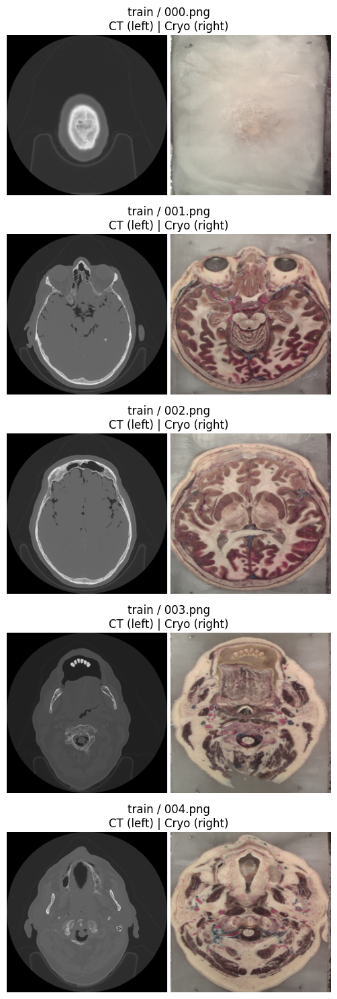

In [ ]:


def list_subset_files(subset: str):
    """
    Return (subset_dir, files) for the chosen subset.

    Parameters
    ----------
    subset : str
        One of 'train', 'val', or 'test'.
    """
    # Decide which directory to use based on subset name.
    # NOTE: train_dir / val_dir / test_dir were already created
    #       in the pix2pix creation cell above.
    if subset == "train":
        subset_dir = train_dir
    elif subset == "val":
        subset_dir = val_dir
    elif subset == "test":
        subset_dir = test_dir
    else:
        raise ValueError("subset must be 'train', 'val', or 'test'")

    # Safety check: does this directory exist?
    if not os.path.isdir(subset_dir):
        raise FileNotFoundError(f"Directory does not exist: {subset_dir}")

    # Keep only .png files (the AB images we created)
    files = [f for f in os.listdir(subset_dir) if f.lower().endswith(".png")]
    files = sorted(files)  # sort alphabetically: 000.png, 001.png, ...
    return subset_dir, files


def show_pix2pix_examples(
    subset: str = "train",
    num_examples: int = 5,
    split_halves: bool = True
):
    """
    Display several pix2pix AB images from a chosen subset.

    Parameters
    ----------
    subset : str
        Which subset to view: 'train', 'val', or 'test'.
    num_examples : int
        How many images to display.
    split_halves : bool
        If False:
            show the full wide AB image (CT|Cryo) as one block.
        If True:
            split each AB into CT (left) and Cryo (right) with a white bar
            so you can easily see the boundary.
    """
    # Get directory and file list for the requested subset
    subset_dir, files = list_subset_files(subset)
    total = len(files)
    print(f"\nSubset '{subset}' has {total} images.")

    if total == 0:
        print("No images to display in this subset.")
        return

    # Clamp num_examples so we don't ask for more than exist
    num_examples = min(num_examples, total)

    # OPTION A: use first N images (deterministic)
    chosen_files = files[:num_examples]
    # OPTION B: random N images (uncomment next two lines and comment out the line above)
    # chosen_files = random.sample(files, num_examples)

    print(f"Displaying {num_examples} example(s) from '{subset}':")
    for name in chosen_files:
        print("  ", name)

    # Prepare figure: one row per example
    rows = num_examples
    cols = 1  # each axes will show one AB (possibly split internally)

    fig, axes = plt.subplots(
        nrows=rows,
        ncols=cols,
        figsize=(10, 3 * rows)
    )

    # If there's only one example, axes is not a list; normalize it
    if rows == 1:
        axes = [axes]

    # Loop over chosen files and display them
    for ax, filename in zip(axes, chosen_files):
        img_path = os.path.join(subset_dir, filename)

        # Load AB image and convert to array
        ab_img = Image.open(img_path)
        ab_arr = np.array(ab_img)  # shape: (H, W_full, 3)

        if not split_halves:
            # -------------------------
            # SIMPLE MODE:
            #   Show entire [CT | Cryo]
            # -------------------------
            ax.imshow(ab_arr)
            ax.set_title(f"{subset} / {filename}\nFull AB (CT left | Cryo right)")
            ax.axis("off")
        else:
            # -------------------------
            # SPLIT MODE:
            #   Cut into CT (left) and Cryo (right),
            #   then show them with a white bar between.
            # -------------------------
            H, W_full, C = ab_arr.shape
            half_width = W_full // 2  # assume AB is exactly [A|B] with equal widths

            # Left half = CT, right half = Cryo
            ct_arr   = ab_arr[:, :half_width, :]
            cryo_arr = ab_arr[:, half_width:, :]

            # White spacer bar for clarity (optional)
            spacer_width = 5  # pixels
            white_bar = 255 * np.ones((H, spacer_width, C), dtype=np.uint8)

            # Combine as [CT | white_bar | Cryo]
            combined_row = np.concatenate([ct_arr, white_bar, cryo_arr], axis=1)

            ax.imshow(combined_row)
            ax.set_title(f"{subset} / {filename}\nCT (left) | Cryo (right)")
            ax.axis("off")

    plt.tight_layout()
    plt.show()


# --------------------------------------------
# EXAMPLE CALLS (pick one to run)
# --------------------------------------------

# Show 5 examples from the TRAIN set, split into CT and Cryo halves
show_pix2pix_examples(subset="train", num_examples=5, split_halves=True)

# If you also want to inspect val/test, run these too:
# show_pix2pix_examples(subset="val",  num_examples=5, split_halves=True)
# show_pix2pix_examples(subset="test", num_examples=5, split_halves=True)


In [ ]:
dodsfjldjfl

# Pix2Pix training

## Clone CycleGAN + Pix2Pix repo
This repo contains:
- train.py   (training code for pix2pix + cyclegan)
- test.py    (testing/inference code)
- model architectures
- data loaders, utils, etc.

In [ ]:
repo_dir = "/content/pytorch-CycleGAN-and-pix2pix"

# Clone only if not already cloned in this runtime.
if not os.path.isdir(repo_dir):
    !git clone https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix.git {repo_dir}

# Move into the repo folder so train.py and test.py are available.
%cd {repo_dir}

# Show contents so the user sees the repo is ready.
!ls -R . | head -n 50


Cloning into '/content/pytorch-CycleGAN-and-pix2pix'...
remote: Enumerating objects: 2619, done.
remote: Total 2619 (delta 0), reused 0 (delta 0), pack-reused 2619 (from 1)
Receiving objects: 100% (2619/2619), 8.24 MiB | 41.96 MiB/s, done.
Resolving deltas: 100% (1654/1654), done.
/content/pytorch-CycleGAN-and-pix2pix
.:
CycleGAN.ipynb
data
datasets
docs
environment.yml
imgs
LICENSE
models
options
pix2pix.ipynb
README.md
scripts
test.py
train.py
util

./data:
aligned_dataset.py
base_dataset.py
colorization_dataset.py
image_folder.py
__init__.py
single_dataset.py
template_dataset.py
unaligned_dataset.py

./datasets:
bibtex
combine_A_and_B.py
download_cyclegan_dataset.sh
download_pix2pix_dataset.sh
make_dataset_aligned.py
prepare_cityscapes_dataset.py

./datasets/bibtex:
cityscapes.tex
facades.tex
handbags.tex
shoes.tex
transattr.tex

./docs:
datasets.md
Dockerfile
docker.md
overview.md
qa.md
README_es.md
tips.md


## Training

PIX2PIX TRAINING CELL
- Trains CT -> Cryo model using paired AB images
- Saves checkpoints every epoch
- Prints losses regularly to the notebook
- Saves sample images occasionally for sanity checking

In [ ]:
# ------------------------------------
# 0. MAKE SURE WE ARE INSIDE THE CYCLEGAN/PIX2PIX REPO
# ------------------------------------
# This repo was cloned earlier to:
#   /content/pytorch-CycleGAN-and-pix2pix
# We change directory into it so that train.py and test.py are available.
%cd /content/pytorch-CycleGAN-and-pix2pix

# 1. DATASET ROOT (WHERE AB IMAGES LIVE)
# ------------------------------------
# This is the root folder that contains:
#   pix2pix_dataset/
#       train/
#       val/
#       test/
# Each image in train/val/test is one wide AB image:
#   [ CT (left half) | Cryo (right half) ]
# That is exactly what pix2pix expects for dataset_mode='aligned'.

pix2pix_data_root = os.path.join(ellie_base, "pix2pix_dataset")

print("Pix2pix dataset located at:", pix2pix_data_root)
print("  Train folder exists? ", os.path.isdir(os.path.join(pix2pix_data_root, "train")))
print("  Val   folder exists? ", os.path.isdir(os.path.join(pix2pix_data_root, "val")))
print("  Test  folder exists? ", os.path.isdir(os.path.join(pix2pix_data_root, "test")))
print()

# ------------------------------------
# 2. CHECKPOINTS ROOT (WHERE MODELS + LOGS WILL BE SAVED)
# ------------------------------------
# This is YOUR private folder for all pix2pix checkpoints and logs.
# Nothing is written back into the shared CT/Cryo folders.

checkpoints_root = os.path.join(ellie_base, "checkpoints_pix2pix")
os.makedirs(checkpoints_root, exist_ok=True)

print("Model checkpoints + logs will be saved under:")
print("  ", checkpoints_root)
print()

# ------------------------------------
# 3. TRAINING OPTIONS
# ------------------------------------
# experiment_name:
#   - Subfolder name inside checkpoints_root.
#   - All files for THIS run go into:
#         checkpoints_root / experiment_name / ...
#
# n_epochs / n_epochs_decay:
#   - n_epochs: number of epochs with constant learning rate
#   - n_epochs_decay: number of epochs with linearly decaying learning rate
#   - Here: 50 + 50 = 100 total epochs.
#
# batch_size:
#   - For pix2pix on 256x256 images, batch_size=1 is standard.

experiment_name = "ct2cryo_pix2pix"

n_epochs       = 50   # epochs with constant LR
n_epochs_decay = 50   # epochs with linearly decaying LR
batch_size     = 1    # pix2pix usually uses batch_size=1

# ------------------------------------
# 4. BUILD THE TRAINING COMMAND STRING
# ------------------------------------
# Important flags:
#   --dataroot            : folder containing train/val/test AB images
#   --name                : experiment name (subfolder under checkpoints_root)
#   --model pix2pix       : use pix2pix model (NOT cycle_gan)
#   --dataset_mode aligned: tells pix2pix that data is AB pairs
#   --direction AtoB      : left half (A=CT) -> right half (B=Cryo)
#   --input_nc/output_nc  : 3-channel RGB in and out
#   --preprocess none     : do NOT resize/crop inside the model (we already did 256x256)
#   --load_size/crop_size : 256 (match the pix2pix_dataset creation)
#   --checkpoints_dir     : put checkpoints under ellie_base/checkpoints_pix2pix
#   --print_freq          : how often (in iterations) to print losses to the notebook
#   --save_epoch_freq     : how often (in epochs) to save checkpoints (here, every epoch)
#   --display_freq        : how often to save sample images (in iterations)
#   --update_html_freq    : how often to update HTML log + images
#   --display_id 0        : disables Visdom windows (we just save images to disk)

train_command = f"""
python train.py \\
    --dataroot "{pix2pix_data_root}" \\
    --name "{experiment_name}" \\
    --model pix2pix \\
    --dataset_mode aligned \\
    --direction AtoB \\
    --input_nc 3 \\
    --output_nc 3 \\
    --batch_size {batch_size} \\
    --preprocess none \\
    --load_size 256 \\
    --crop_size 256 \\
    --n_epochs {n_epochs} \\
    --n_epochs_decay {n_epochs_decay} \\
    --checkpoints_dir "{checkpoints_root}" \\
    --print_freq 50 \\
    --save_epoch_freq 1 \\
    --display_freq 200 \\
    --update_html_freq 200 \\
"""
#     --display_id 0


print("============= TRAINING COMMAND =============")
print(train_command)
print("===========================================\n")

# ------------------------------------
# 5. RUN THE TRAINING
# ------------------------------------
# This will:
#   - Train for 100 epochs (50 + 50)
#   - Print loss values every 50 iterations
#   - Save a checkpoint every epoch:
#         checkpoints_root / experiment_name / epoch_XX_net_G.pth
#   - Save a text log of all losses:
#         checkpoints_root / experiment_name / loss_log.txt
#   - Save some sample generated images in:
#         checkpoints_root / experiment_name / web / images / ...
# You can manually stop this cell at any time (Interrupt execution).
# All checkpoints + logs up to that point will still be saved.

!{train_command}


/content/pytorch-CycleGAN-and-pix2pix
Pix2pix dataset located at: /content/drive/My Drive/Colab Notebooks/Computer Vision/CV Project- Ellie/pix2pix_dataset
  Train folder exists?  True
  Val   folder exists?  True
  Test  folder exists?  True

Model checkpoints + logs will be saved under:
   /content/drive/My Drive/Colab Notebooks/Computer Vision/CV Project- Ellie/checkpoints_pix2pix

============= TRAINING COMMAND =============

python train.py \
    --dataroot "/content/drive/My Drive/Colab Notebooks/Computer Vision/CV Project- Ellie/pix2pix_dataset" \
    --name "ct2cryo_pix2pix" \
    --model pix2pix \
    --dataset_mode aligned \
    --direction AtoB \
    --input_nc 3 \
    --output_nc 3 \
    --batch_size 1 \
    --preprocess none \
    --load_size 256 \
    --crop_size 256 \
    --n_epochs 50 \
    --n_epochs_decay 50 \
    --checkpoints_dir "/content/drive/My Drive/Colab Notebooks/Computer Vision/CV Project- Ellie/checkpoints_pix2pix" \
    --print_freq 50 \
    --save_epoch_f

## Metrics Log
PARSE loss_log.txt AND SAVE PER-EPOCH LOSSES

This cell:
  - Reads the loss_log.txt created by train.py
  - Extracts losses (G_GAN, G_L1, D_real, D_fake) per iteration
  - Computes average losses per epoch
  - Displays them in a table
  - Saves them to a CSV file in your ellie_base folder

REQUIREMENTS:
  - Cell 1 (training) has been run at least once.
  - checkpoints_root and experiment_name are still defined.

In [ ]:

# ------------------------------------
# 1. PATH TO loss_log.txt
# ------------------------------------
# train.py writes a log file under:
#   checkpoints_root / experiment_name / loss_log.txt

loss_log_path = os.path.join(
    checkpoints_root,   # defined in training cell
    experiment_name,    # defined in training cell
    "loss_log.txt"
)

print("Reading loss log from:")
print("  ", loss_log_path)

if not os.path.isfile(loss_log_path):
    raise FileNotFoundError(f"loss_log.txt not found at: {loss_log_path}")

# ------------------------------------
# 2. PARSE THE LOG FILE LINE BY LINE
# ------------------------------------
# Example of lines we are interested in:
#   (epoch: 1, iters: 50, time: 0.1, data: 0.01) G_GAN: 0.5 G_L1: 12.3 D_real: 0.6 D_fake: 0.7
#
# We will extract:
#   - epoch (int)
#   - iters (int)
#   - G_GAN (float, if present)
#   - G_L1 (float, if present)
#   - D_real (float, if present)
#   - D_fake (float, if present)

records = []  # list of dicts, one per logged line

with open(loss_log_path, "r") as f:
    for line in f:
        # We only care about lines that contain both 'epoch:' and 'iters:'
        if "epoch:" not in line or "iters:" not in line:
            continue

        # Extract epoch number
        m_epoch = re.search(r"epoch:\s*(\d+)", line)
        # Extract iteration number within the epoch
        m_iters = re.search(r"iters:\s*(\d+)", line)

        if not m_epoch or not m_iters:
            continue  # skip lines that don't match the expected pattern

        epoch = int(m_epoch.group(1))
        iters = int(m_iters.group(1))

        # Helper function to extract a numeric loss by name (e.g., "G_GAN")
        def get_loss(name: str):
            """
            Try to extract a loss value like 'G_GAN: 0.123' from the line.
            Returns float value if found, otherwise None.
            """
            m = re.search(rf"{name}:\s*([0-9.eE+-]+)", line)
            return float(m.group(1)) if m else None

        G_GAN  = get_loss("G_GAN")
        G_L1   = get_loss("G_L1")
        D_real = get_loss("D_real")
        D_fake = get_loss("D_fake")

        records.append({
            "epoch": epoch,
            "iters": iters,
            "G_GAN": G_GAN,
            "G_L1": G_L1,
            "D_real": D_real,
            "D_fake": D_fake
        })

# Put all parsed rows into a DataFrame
df = pd.DataFrame(records)

print("\nFirst few raw log rows (per iteration):")
display(df.head())

# ------------------------------------
# 3. COMPUTE PER-EPOCH AVERAGE LOSSES
# ------------------------------------
# We group by 'epoch' and take the mean of numeric columns.
# This gives one row per epoch, summarizing how the losses behaved on average.

epoch_stats = df.groupby("epoch").mean(numeric_only=True).reset_index()

print("\nPer-epoch average losses:")
display(epoch_stats)

# ------------------------------------
# 4. SAVE METRICS TO CSV IN YOUR ELLIE FOLDER
# ------------------------------------
# The CSV file will contain columns:
#   epoch, G_GAN, G_L1, D_real, D_fake
# You can open this in Excel, Google Sheets, or Python later.

metrics_out_path = os.path.join(ellie_base, "pix2pix_epoch_metrics.csv")
epoch_stats.to_csv(metrics_out_path, index=False)

print("\nSaved per-epoch metrics to:")
print("  ", metrics_out_path)


Reading loss log from:
   /content/drive/My Drive/Colab Notebooks/Computer Vision/CV Project- Ellie/checkpoints_pix2pix/ct2cryo_pix2pix/loss_log.txt

First few raw log rows (per iteration):


,epoch,iters,G_GAN,G_L1,D_real,D_fake
0,1,50,1.978,22.410,0.364,0.166
1,1,100,2.275,23.504,0.119,0.228
2,1,150,1.870,22.549,0.174,0.546
3,1,200,2.149,15.958,0.447,0.054
4,1,250,2.307,18.317,0.190,0.250



Per-epoch average losses:


,epoch,iters,G_GAN,G_L1,D_real,D_fake
0,1,200.0,2.038571,20.636143,0.255000,0.255000
1,2,180.0,1.585286,15.798143,0.468286,0.559429
2,3,185.0,1.432625,15.487375,0.539875,0.334125
3,4,190.0,1.250000,13.730286,0.540571,0.376429
4,5,195.0,1.606000,15.480875,0.323875,0.676125
...,...,...,...,...,...,...
95,96,200.0,1.601857,5.174000,0.271143,0.330571
96,97,180.0,1.518000,6.020571,0.332286,0.338143
97,98,185.0,1.590250,5.349000,0.370875,0.304000
98,99,190.0,1.643429,5.016000,0.316429,0.309857



Saved per-epoch metrics to:
   /content/drive/My Drive/Colab Notebooks/Computer Vision/CV Project- Ellie/pix2pix_epoch_metrics.csv


## Image Viewer

  - Looks in the pix2pix training web/images folder
  - Finds the most recent generated Cryo images (fake_B)
  - Displays a small grid of them in the notebook

Web images directory:
   /content/drive/My Drive/Colab Notebooks/Computer Vision/CV Project- Ellie/checkpoints_pix2pix/ct2cryo_pix2pix/web/images

Showing 6 most recent fake_B images:


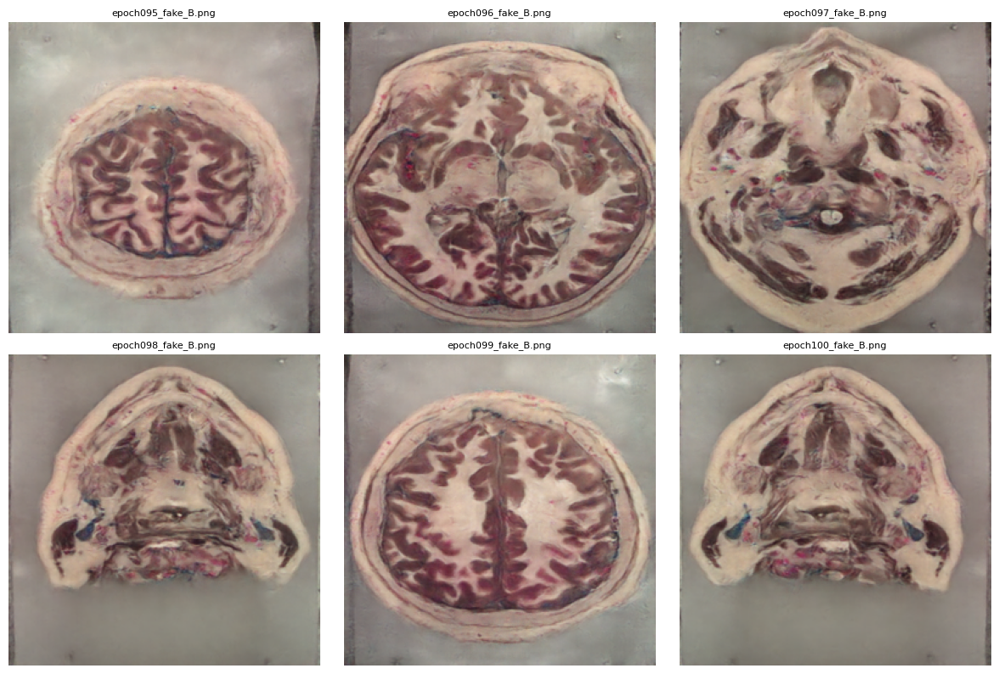

In [ ]:

# REQUIREMENTS:
#   - Training has run long enough to create some web/images outputs.
#   - checkpoints_root and experiment_name are still defined.
# ============================================================

# ------------------------------------
# 1. FOLDER CONTAINING PREVIEW IMAGES
# ------------------------------------
# train.py (with display_freq / update_html_freq) writes images to:
#   checkpoints_root / experiment_name / web / images

web_images_dir = os.path.join(
    checkpoints_root,    # from training cell
    experiment_name,     # from training cell
    "web",
    "images"
)

print("Web images directory:")
print("  ", web_images_dir)

if not os.path.isdir(web_images_dir):
    print("\nNo web/images folder found yet. Run some training first.")
else:
    # ------------------------------------
    # 2. COLLECT ALL fake_B IMAGES
    # ------------------------------------
    # By convention:
    #   - fake_B = generated Cryo images
    #   - real_A = input CT images
    #   - real_B = ground-truth Cryo (for some datasets)
    #
    # We only grab filenames that contain 'fake_B' and end in .png.

    all_fake = [
        f for f in os.listdir(web_images_dir)
        if ("fake_B" in f and f.lower().endswith(".png"))
    ]

    if not all_fake:
        print("\nNo fake_B images found yet in web/images.")
    else:
        # Sort filenames so that later epochs/iterations come last
        # (e.g., epoch050_iter00400_fake_B.png will appear after epoch001_...)
        all_fake_sorted = sorted(all_fake)

        # ------------------------------------
        # 3. CHOOSE HOW MANY RECENT IMAGES TO SHOW
        # ------------------------------------
        N = 6  # number of most recent fake_B images to display
        chosen = all_fake_sorted[-N:]  # take the last N entries

        print(f"\nShowing {len(chosen)} most recent fake_B images:")

        # Arrange them in a grid: 'rows' x 'cols'
        cols = 3
        rows = int(np.ceil(len(chosen) / cols))

        fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))

        # If rows*cols > 1, axes is a 2D array; flatten to 1D for easy indexing
        axes = np.array(axes).reshape(-1)

        # ------------------------------------
        # 4. PLOT EACH CHOSEN IMAGE
        # ------------------------------------
        for ax, fname in zip(axes, chosen):
            img_path = os.path.join(web_images_dir, fname)
            img = Image.open(img_path)

            ax.imshow(img)
            ax.set_title(fname, fontsize=8)  # show filename (includes epoch/iter)
            ax.axis("off")

        # Turn off any unused subplot axes (if rows*cols > number of images)
        for ax in axes[len(chosen):]:
            ax.axis("off")

        plt.tight_layout()
        plt.show()


# Testing and Inference

This uses the trained pix2pix model to convert CT (A) → Cryo (B).
The model reads images from:
     pix2pix_dataset/test/
and outputs:
     results/ct2cryo_pix2pix/test_latest/images

The important output files are:
     0000_fake_B.png    <-- FAKE CRYO
     0000_real_A.png    <-- the CT input

This cell:
  - Loads a trained pix2pix generator from your checkpoints folder
  - Runs it on the TEST split of your pix2pix_dataset
  - Writes results into: ./results/ct2cryo_pix2pix/test_<epoch>/images
  - Optionally displays a few of the generated Cryo slices

Using data root:      /content/drive/My Drive/Colab Notebooks/Computer Vision/CV Project- Ellie/pix2pix_dataset
Using checkpoints at: /content/drive/My Drive/Colab Notebooks/Computer Vision/CV Project- Ellie/checkpoints_pix2pix
Experiment name:      ct2cryo_pix2pix

Running test command:

python test.py \
    --dataroot "/content/drive/My Drive/Colab Notebooks/Computer Vision/CV Project- Ellie/pix2pix_dataset" \
    --name "ct2cryo_pix2pix" \
    --model pix2pix \
    --dataset_mode aligned \
    --direction AtoB \
    --num_test 50 \
    --preprocess none \
    --load_size 256 \
    --crop_size 256 \
    --checkpoints_dir "/content/drive/My Drive/Colab Notebooks/Computer Vision/CV Project- Ellie/checkpoints_pix2pix" \
    --epoch latest

----------------- Options ---------------
             aspect_ratio: 1.0                           
               batch_size: 1                             
          checkpoints_dir: /content/drive/My Drive/Colab Notebooks/Computer Vision/CV Project

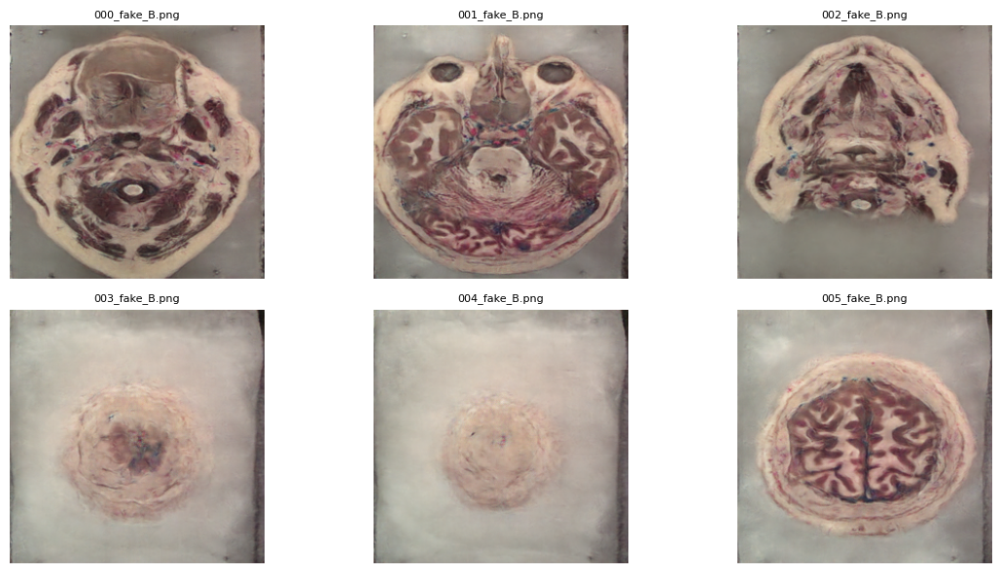

In [ ]:
# ============================================================
# TEST PIX2PIX — GENERATE FAKE CRYO FROM CT (A -> B)
# ============================================================


# -----------------------------
# 1. PATHS (MUST MATCH TRAINING)
# -----------------------------
pix2pix_data_root = os.path.join(ellie_base, "pix2pix_dataset")
checkpoints_root  = os.path.join(ellie_base, "checkpoints_pix2pix")
experiment_name   = "ct2cryo_pix2pix"   # same as in training

print("Using data root:     ", pix2pix_data_root)
print("Using checkpoints at:", checkpoints_root)
print("Experiment name:     ", experiment_name)

# -----------------------------
# 2. WHICH EPOCH TO TEST?
# -----------------------------
# Options:
#   - "latest"      : use latest_net_G.pth
#   - "1", "5", "10": use epoch_1_net_G.pth, epoch_5_net_G.pth, etc.
#
# For a full 50+50 run, you'll likely want something like "50", "100", or "latest".
# You can adjust this once you inspect pix2pix_epoch_metrics.csv.

epoch_to_test = "latest"   # <-- CHANGE this to "50", "100", etc. if you want a specific epoch

# -----------------------------
# 3. HOW MANY TEST IMAGES?
# -----------------------------
# num_test:
#   - How many images from the test set to process.
#   - If you set a large number (e.g., 9999), it will just process all test images.

num_test = 50   # for a quick check; set to 9999 to run on entire test set

# -----------------------------
# 4. BUILD TEST COMMAND
# -----------------------------
test_command = f"""
python test.py \\
    --dataroot "{pix2pix_data_root}" \\
    --name "{experiment_name}" \\
    --model pix2pix \\
    --dataset_mode aligned \\
    --direction AtoB \\
    --num_test {num_test} \\
    --preprocess none \\
    --load_size 256 \\
    --crop_size 256 \\
    --checkpoints_dir "{checkpoints_root}" \\
    --epoch {epoch_to_test}
"""

print("\nRunning test command:")
print(test_command)

# -----------------------------
# 5. RUN THE TEST SCRIPT
# -----------------------------
!{test_command}

# -----------------------------
# 6. QUICK PREVIEW OF OUTPUT IMAGES
# -----------------------------
# test.py writes results to:
#   ./results/<experiment_name>/test_<epoch>/images
#
# Where you'll find:
#   - XXXX_real_A.png : input CT
#   - XXXX_fake_B.png : generated Cryo
#   - (sometimes XXXX_real_B.png if ground-truth exists)

results_root = "/content/pytorch-CycleGAN-and-pix2pix/results"
results_dir = os.path.join(
    results_root,
    experiment_name,
    f"test_{epoch_to_test}",
    "images"
)

print("\nLooking for generated images in:")
print("  ", results_dir)

if not os.path.isdir(results_dir):
    print("No results directory found yet. Check that test.py ran successfully.")
else:
    # Grab a few fake_B images (generated Cryo) to visualize
    result_files = sorted([f for f in os.listdir(results_dir) if "fake_B" in f])[:6]

    if not result_files:
        print("No fake_B images found in results directory.")
    else:
        print(f"Showing {len(result_files)} generated Cryo images (fake_B):")

        plt.figure(figsize=(12, 6))
        cols = 3
        rows = (len(result_files) + cols - 1) // cols

        for i, fname in enumerate(result_files):
            img_path = os.path.join(results_dir, fname)
            img = Image.open(img_path)

            plt.subplot(rows, cols, i + 1)
            plt.imshow(img)
            plt.title(fname, fontsize=8)
            plt.axis("off")

        plt.tight_layout()
        plt.show()


# Preview Outputs

This cell should be run AFTER you run test.py.

It looks into the results folder created by test.py and:
  - Finds images named '*fake_B*.png' (generated Cryo sections)
  - Shows up to 10 of them as a quick sanity check

It supports both:
  - epoch_to_test = "latest"  -> results/.../test_latest/images
  - epoch_to_test = "5"       -> results/.../test_5/images

This section will use the model on all images in the CT folder to obtain their cryosection reconstructions and will save those images into the shared folder.


Looking for results in: /content/pytorch-CycleGAN-and-pix2pix/results/ct2cryo_pix2pix/test_latest/images
Showing 10 fake_B images:


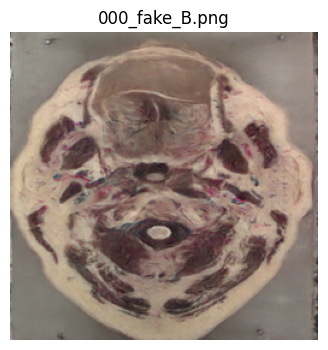

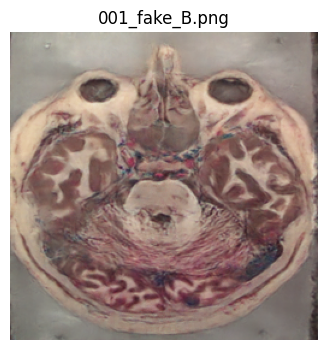

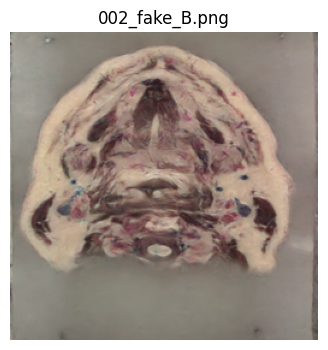

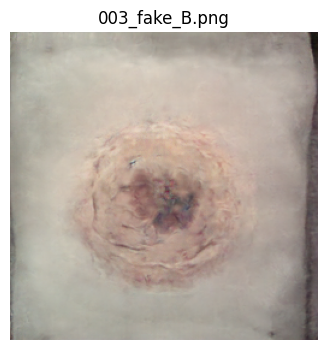

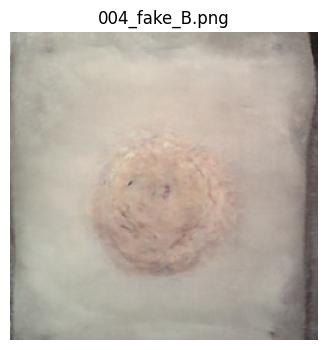

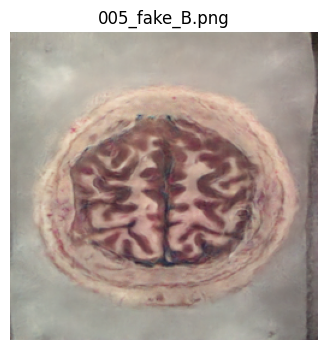

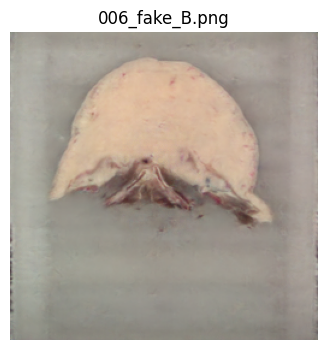

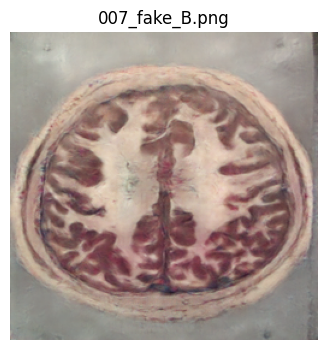

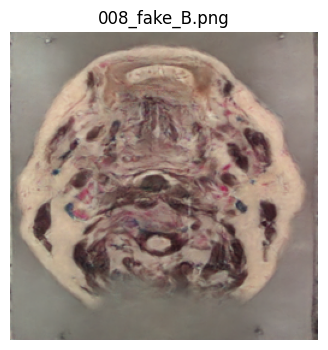

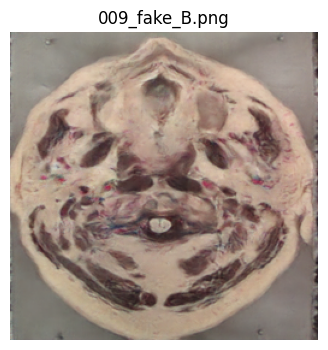

In [ ]:
# ------------------------------------------------------------
# PREVIEW SOME OF THE GENERATED FAKE CRYO IMAGES (fake_B)
# ------------------------------------------------------------


# Base results directory used by the CycleGAN/pix2pix repo
results_root = "/content/pytorch-CycleGAN-and-pix2pix/results"

# Decide the test subfolder name based on epoch_to_test
# - If epoch_to_test == "latest", test.py writes to "test_latest"
# - Otherwise, test.py writes to f"test_{epoch_to_test}"
if epoch_to_test == "latest":
    test_subdir = "test_latest"
else:
    test_subdir = f"test_{epoch_to_test}"

# Build the full path to the images folder:
#   results_root / experiment_name / test_<epoch>/images
res_dir = os.path.join(results_root, experiment_name, test_subdir, "images")

print("\nLooking for results in:", res_dir)

# Check that the folder actually exists
if not os.path.isdir(res_dir):
    print(" Results directory does not exist yet.")
    print("Make sure you ran test.py successfully before this cell.")
else:
    # Get a few fake_B images (pix2pix's generated Cryo)
    # We only grab files that contain 'fake_B' and end in .png
    fake_files = sorted(
        [f for f in os.listdir(res_dir) if "fake_B" in f and f.lower().endswith(".png")]
    )[:10]  # limit to first 10 for a quick preview

    if not fake_files:
        print("No fake_B images found. Check if test.py ran successfully.")
    else:
        print(f"Showing {len(fake_files)} fake_B images:")

        # Loop over the selected files and display each one
        for f in fake_files:
            img_path = os.path.join(res_dir, f)
            img = Image.open(img_path)

            plt.figure(figsize=(4, 4))
            plt.title(f)
            plt.imshow(img)
            plt.axis("off")
            plt.show()


# Full Inference on All CT Images

This section will use the trained Pix2Pix model to generate Cryo (fake_B) images for *all* original CT images that were part of your dataset, not just the test split.

In [ ]:
# ------------------------------------------------------------
# 1. PREPARE FULL INFERENCE DATASET
# ------------------------------------------------------------

# Create a new directory for inference data (all CTs).
inference_data_root = os.path.join(ellie_base, "pix2pix_full_inference_dataset")
os.makedirs(inference_data_root, exist_ok=True)

# Create the 'test' subdirectory within the inference_data_root
inference_data_root_test_dir = os.path.join(inference_data_root, "test")
os.makedirs(inference_data_root_test_dir, exist_ok=True)

print(f"Preparing full inference dataset in: {inference_data_root_test_dir}")

# Reuse the save_ct_cryo_pair_as_pix2pix function defined earlier.
# For inference, the 'B' side of the image doesn't matter, it's just a placeholder.
# We are mainly interested in feeding the 'A' (CT) side.
# We will use the same 'pairs' list that covers all N_ct images.

num_inference_images = len(pairs)

for i, (ct_path, cryo_path, ct_idx, cryo_idx) in enumerate(pairs):
    filename = make_filename(i) # Use original image order for consistent filenames
    save_path = os.path.join(inference_data_root_test_dir, filename) # Save to the 'test' subdirectory
    save_ct_cryo_pair_as_pix2pix(ct_path, cryo_path, save_path, size=target_size)

print(f"Finished creating {num_inference_images} inference images.")

# ------------------------------------------------------------
# 2. RUN THE TEST SCRIPT ON THE FULL INFERENCE DATASET
# ------------------------------------------------------------

# Make sure we are in the CycleGAN repo directory
%cd /content/pytorch-CycleGAN-and-pix2pix

# Paths (mostly reused from training/testing)
pix2pix_data_root = inference_data_root # Use our newly created inference dataset (which now contains a 'test' subfolder)
checkpoints_root  = os.path.join(ellie_base, "checkpoints_pix2pix")
experiment_name   = "ct2cryo_pix2pix"     # The original experiment name to load the model

# This is the desired name for the *output folder* for these full inference results.
# It will be a subfolder under the CycleGAN/pix2pix 'results' directory.
full_inference_output_name = "ct2cryo_pix2pix_full_inference_output"

# Which epoch to test? (Use the same as before, or specify a final one)
epoch_to_test = "latest" # Or "50", "100" etc.

print("\nRunning full inference with parameters:")
print(f"  Data root:         {pix2pix_data_root}")
print(f"  Checkpoints:       {checkpoints_root}")
print(f"  Model to load:     {experiment_name}")
print(f"  Output results will initially be in: ./results/{experiment_name}/test_{epoch_to_test}/images")
print(f"  Then moved to:     ./results/{full_inference_output_name}/test_{epoch_to_test}/images")

# The --name argument to test.py must match the `experiment_name` of the trained model
# to ensure the correct checkpoint is loaded.
test_command_full_inference = f"""
python test.py \
    --dataroot "{pix2pix_data_root}" \
    --name "{experiment_name}" \
    --model pix2pix \
    --dataset_mode aligned \
    --direction AtoB \
    --num_test {num_inference_images} \
    --preprocess none \
    --load_size 256 \
    --crop_size 256 \
    --checkpoints_dir "{checkpoints_root}" \
    --epoch {epoch_to_test}
"""

print("\n============= FULL INFERENCE COMMAND ============")
print(test_command_full_inference)
print("=================================================\n")

!{test_command_full_inference}

# ------------------------------------------------------------
# 3. MOVE GENERATED IMAGES TO THE DESIRED OUTPUT FOLDER
# ------------------------------------------------------------
# test.py saved results to: results_root / experiment_name / test_latest / images
# We want them in:         results_root / full_inference_output_name / test_latest / images

results_root = "/content/pytorch-CycleGAN-and-pix2pix/results" # Base results directory

if epoch_to_test == "latest":
    test_subdir = "test_latest"
else:
    test_subdir = f"test_{epoch_to_test}"

source_results_dir = os.path.join(
    results_root,
    experiment_name, # This is the 'name' used in the test command
    test_subdir,
    "images"
)

destination_results_dir = os.path.join(
    results_root,
    full_inference_output_name, # This is the custom name we want for output
    test_subdir,
    "images"
)

print(f"\nMoving generated images from: {source_results_dir}")
print(f"To: {destination_results_dir}")

# Create destination directory if it doesn't exist
os.makedirs(destination_results_dir, exist_ok=True)

# Move only the 'fake_B.png' files
if os.path.isdir(source_results_dir):
    for filename in os.listdir(source_results_dir):
        if "fake_B" in filename and filename.lower().endswith(".png"):
            shutil.move(
                os.path.join(source_results_dir, filename),
                os.path.join(destination_results_dir, filename)
            )
    print("Moved fake_B images successfully.")
    # Optionally, remove the source directory if it's empty after moving
    # Note: os.rmdir only works if the directory is empty. shutil.rmtree for non-empty.
    # For safety, let's just leave the original folder if it contains other files (real_A, real_B)
else:
    print("Source results directory not found, skipping move.")


# ------------------------------------------------------------
# 4. PREVIEW SOME OF THE GENERATED IMAGES FROM THE NEW LOCATION
# ------------------------------------------------------------

res_dir_full_inference = destination_results_dir # Now this points to the new location

print(f"\nLooking for full inference results in: {res_dir_full_inference}")

if not os.path.isdir(res_dir_full_inference):
    print("Full inference results directory does not exist yet. Check for errors above.")
else:
    fake_files = sorted(
        [f for f f in os.listdir(res_dir_full_inference) if "fake_B" in f and f.lower().endswith(".png")]
    )[:10] # Display first 10 for quick check

    if not fake_files:
        print("No fake_B images found in the full inference results directory.")
    else:
        print(f"Showing {len(fake_files)} generated fake Cryo images (fake_B) from full inference:")

        for f in fake_files:
            img_path = os.path.join(res_dir_full_inference, f)
            img = Image.open(img_path)

            plt.figure(figsize=(4, 4))
            plt.title(f)
            plt.imshow(img)
            plt.axis("off")
            plt.show()

print("\nFull inference completed! You can find all generated images in:")
print(f"  {res_dir_full_inference}")

Preparing full inference dataset in: /content/drive/My Drive/Colab Notebooks/Computer Vision/CV Project- Ellie/pix2pix_full_inference_dataset/test
Finished creating 463 inference images.
/content/pytorch-CycleGAN-and-pix2pix

Running full inference with parameters:
  Data root:         /content/drive/My Drive/Colab Notebooks/Computer Vision/CV Project- Ellie/pix2pix_full_inference_dataset
  Checkpoints:       /content/drive/My Drive/Colab Notebooks/Computer Vision/CV Project- Ellie/checkpoints_pix2pix
  Experiment name:   ct2cryo_pix2pix
  Results will be in: ./results/ct2cryo_pix2pix_full_inference/test_latest/images

============= FULL INFERENCE COMMAND ============

python test.py     --dataroot "/content/drive/My Drive/Colab Notebooks/Computer Vision/CV Project- Ellie/pix2pix_full_inference_dataset"     --name "ct2cryo_pix2pix_full_inference"     --model pix2pix     --dataset_mode aligned     --direction AtoB     --num_test 463     --preprocess none     --load_size 256     --crop_s

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import os

# Ensure res_dir_full_inference and fake_files are available from the previous cell

if 'res_dir_full_inference' in globals() and 'fake_files' in globals() and fake_files:
    # Take the first generated fake_B image for inspection
    sample_fake_B_filename = fake_files[0]
    sample_fake_B_path = os.path.join(res_dir_full_inference, sample_fake_B_filename)

    print(f"Inspecting: {sample_fake_B_path}")

    img = Image.open(sample_fake_B_path)
    img_arr = np.array(img)

    H, W_full, C = img_arr.shape
    half_width = W_full // 2

    if W_full > H: # Check if the width is significantly greater than height (indicates concatenation)
        # Assume it's an A|B concatenated image
        left_half  = img_arr[:, :half_width, :]
        right_half = img_arr[:, half_width:, :]

        fig, axes = plt.subplots(1, 2, figsize=(10, 5))

        axes[0].imshow(left_half)
        axes[0].set_title("Left Half (Possibly Input CT)")
        axes[0].axis('off')

        axes[1].imshow(right_half)
        axes[1].set_title("Right Half (Generated Cryo)")
        axes[1].axis('off')

        plt.suptitle(f"Split View of {sample_fake_B_filename}")
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

    else:
        # Assume it's a single image
        plt.figure(figsize=(5, 5))
        plt.imshow(img_arr)
        plt.title(f"Single Image: {sample_fake_B_filename}")
        plt.axis('off')
        plt.show()

else:
    print("No generated fake_B images found to inspect. Please ensure the full inference cell ran successfully.")

Inspecting: /content/pytorch-CycleGAN-and-pix2pix/results/ct2cryo_pix2pix_full_inference/test_latest/images/000_fake_B.png


FileNotFoundError: [Errno 2] No such file or directory: '/content/pytorch-CycleGAN-and-pix2pix/results/ct2cryo_pix2pix_full_inference/test_latest/images/000_fake_B.png'